In [1]:
!date

Fri Sep 12 11:16:00 PDT 2025


# 2025-09-12: BMMC - Run starCAT on CD4 T cells - all Cells
### By [Aishwarya Chander](aishwarya.chander@alleninstitute.org), High Resolution Translational Immunology, Allen Institute for Immunology

**Main aim**: \
In this notebook, I will use the method described by [Kotliar et al.](https://github.com/immunogenomics/starCAT) to perform NMF decomposition with a pre-computed matrix to identify niche T cell states within all T cells in the BMMC dataset. This notebook uses the kernel defined in the `rna-setup/ac-starcat-envt.yml` file. 
> Tutorial Vigenette: [starCAT_vignette.ipynb](https://github.com/immunogenomics/starCAT/blob/main/Examples/starCAT_vignette.ipynb)
> 
> Overall notebook runtime: ~15 minutes

### 1. Imports

In [2]:
import pandas as pd
import numpy as np
import scanpy as sc
import os
import matplotlib.pyplot as plt
import sys
import seaborn as sns
from starcat import starCAT
import sys

sys.path.append("../../00-utilities/functions/python/")
from process_scrna_data import process_adata

In [3]:
import starcat
starcat.available_refs

array(['TCAT.V1', 'MYELOID.GLIOMA.V1', 'BONEMARROW.CD34POS.HSPC.V1'],
      dtype=object)

### 2. Get the TCAT.v1 reference from starCAT

In [4]:
tcat = starCAT(reference='TCAT.V1', cachedir='./cache')

Using reference from starCAT database
Loading reference from existing cache file for reference TCAT.V1


In [5]:
# View first 5 GEPs and 5 genes for default reference spectra (genes x programs)
print(tcat.ref_name)
display(tcat.ref.iloc[:5, :5])

TCAT.V1


,A1BG,AARD,AARSD1,ABCA1,ABCB1
CellCycle-G2M,2.032614,22.965553,17.423538,3.478179,2.297279
Translation,35.445282,0.000000,9.245893,0.477994,0.000000
HLA,18.192997,14.632670,2.686475,3.937182,0.000000
ISG,0.436212,0.000000,18.078197,17.354506,0.000000
Mito,10.293049,0.000000,52.669895,14.615502,3.341488


In [6]:
# This is the information for the scores that will be calculated byt starCAT with the current reference
tcat.score_data

{'scores': {'continuous': [{'name': 'ASA',
    'normalization': 'normalized',
    'columns': ['TIMD4/TIM3', 'ICOS/CD38', 'CTLA4/CD38', 'OX40/EBI3']},
   {'name': 'Proliferation',
    'normalization': 'normalized',
    'columns': ['CellCycle-G2M', 'CellCycle-S', 'CellCycle-Late-S']}],
  'discrete': [{'name': 'ASA_binary',
    'normalization': 'normalized',
    'columns': ['TIMD4/TIM3', 'ICOS/CD38', 'CTLA4/CD38', 'OX40/EBI3'],
    'threshold': 0.0625},
   {'name': 'Proliferation_binary',
    'normalization': 'normalized',
    'columns': ['CellCycle-G2M', 'CellCycle-S', 'CellCycle-Late-S'],
    'threshold': 0.1},
   {'name': 'Multinomial_Label',
    'normalization': 'normalized',
    'file': 'multinomial_lineage_classifier.py',
    'function': 'compute_lineage'}]}}

### 3. Read in the object built for NMFProj

In [7]:
# Load cell x genes counts data
adata = tcat.load_counts('../../../data/rna/bmmc-celltypes/bmmc-t_cell-processed-harmony.h5ad')

In [8]:
adata

AnnData object with n_obs × n_vars = 593403 × 33538
    obs: 'adt_qc_flag', 'adt_umis', 'batch_id', 'cell_name', 'cell_uuid', 'chip_id', 'hto_barcode', 'hto_category', 'n_genes', 'n_mito_umis', 'n_reads', 'n_umis', 'original_barcodes', 'pbmc_sample_id', 'pool_id', 'seurat_pbmc_type', 'seurat_pbmc_type_score', 'umap_1', 'umap_2', 'well_id', 'ext_l1', 'ext_l2', 'ext_l3', 'healthy_l1', 'healthy_l2', 'healthy_l3', 'aifi_l1', 'aifi_l2', 'aifi_l3', 'predicted_doublet', 'doublet_score', 'sample.sampleKitGuid', 'sample.visitDetails', 'sample.visitName', 'sample.drawDate', 'sample.daysSinceFirstVisit', 'sample.diseaseStatesRecordedAtVisit', 'subject.biologicalSex', 'subject.birthYear', 'subject.ethnicity', 'subject.partnerCode', 'subject.race', 'subject.subjectGuid', 'specimen.specimenGuid', 'cohort.cohortGuid', 'manual.time_stamp', 'tissue', 'manual.response', 'manual.response_type', 'manual.extracted_name', 'manual.batch_id', 'manual.category', 'manual.treatment_dara', 'manual.flu_response', 

In [9]:
adata = adata.raw.to_adata()

### 4. Run starCAT on the raw data & save results

In [10]:
# Run starCAT to compute the usages and scores for the provided data
usage, scores = tcat.fit_transform(adata)

3412 out of 3412 genes in the reference overlap with the query


/home/workspace/environment/starcat/lib/python3.9/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator LogisticRegression from version 1.0.2 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [11]:
usage.head()

,CellCycle-G2M,Translation,HLA,ISG,Mito,Doublet-RBC,gdT,CellCycle-S,Cytotoxic,Doublet-Platelet,...,Tfh-2,OX40/EBI3,CD172a/MERTK,IEG3,Doublet-Fibroblast,SOX4/TOX2,CD40LG/TXNIP,Tph,Exhaustion,Tfh-1
barcodes,,,,,,,,,,,,,,,,,,,,,
97396d7e733f11ee811062d5ef28e4ea,0.002235,0.000097,0.034656,0.017603,0.008038,0.011387,0.019413,0.004503,0.316833,0.001655,...,0.003007,0.003517,0.001402,0.004474,0.002272,0.001713,0.002562,0.004242,0.011823,0.003915
97397972733f11ee811062d5ef28e4ea,0.001742,0.028898,0.015533,0.002325,0.064913,0.022984,0.003448,0.003197,0.006358,0.002276,...,0.018460,0.015215,0.009997,0.000590,0.008000,0.002535,0.036518,0.004784,0.006820,0.004199
97398c46733f11ee811062d5ef28e4ea,0.014048,0.007355,0.002346,0.011372,0.003553,0.009095,0.008585,0.004819,0.366517,0.002576,...,0.000755,0.001270,0.018270,0.011824,0.007780,0.003612,0.008664,0.003178,0.019905,0.000430
97399696733f11ee811062d5ef28e4ea,0.001534,0.000068,0.048330,0.008761,0.000195,0.002599,0.044211,0.012995,0.269211,0.001263,...,0.003518,0.004018,0.000697,0.002655,0.000898,0.002162,0.000955,0.013538,0.041663,0.001193
97399718733f11ee811062d5ef28e4ea,0.004843,0.000021,0.025005,0.030733,0.011382,0.003473,0.038741,0.013992,0.237094,0.002035,...,0.002072,0.007899,0.000658,0.002479,0.003972,0.006086,0.002139,0.006700,0.029824,0.001495


In [12]:
scores.head()

,ASA,Proliferation,ASA_binary,Proliferation_binary,Multinomial_Label
barcodes,,,,,
97396d7e733f11ee811062d5ef28e4ea,0.031877,0.008591,False,False,CD8_TEMRA
97397972733f11ee811062d5ef28e4ea,0.060070,0.007724,False,False,CD4_CM
97398c46733f11ee811062d5ef28e4ea,0.072700,0.019868,True,False,CD8_EM
97399696733f11ee811062d5ef28e4ea,0.041814,0.016425,False,False,CD8_TEMRA
97399718733f11ee811062d5ef28e4ea,0.066780,0.021971,True,False,CD8_EM


In [13]:
usage.to_parquet(
    "../../../data/rna/starcat/bmmc-t-cells-starcat-usages.parquet",
    engine="fastparquet"
)

scores.to_parquet(
    "../../../data/rna/starcat/bmmc-t-cells-starcat-scores.parquet",
    engine="fastparquet"
)

## 5. Add in the usages, scores to adata

In [14]:
# Merge usages and scores with cell metadata
adata.obs = pd.merge(
    left=adata.obs, right=usage, how="left", left_index=True, right_index=True
)

# Modify object type to string for plotting in scanpy
scores[scores.columns[scores.columns.str.contains("_binary")]] = scores[
    scores.columns[scores.columns.str.contains("_binary")]
].astype("str")
adata.obs = pd.merge(
    left=adata.obs, right=scores, how="left", left_index=True, right_index=True
)

In [15]:
starcat_cols = [
    "CellCycle-G2M",
    "Translation",
    "HLA",
    "ISG",
    "Mito",
    "Doublet-RBC",
    "gdT",
    "CellCycle-S",
    "Cytotoxic",
    "Doublet-Platelet",
    "NME1/FABP5",
    "Th22",
    "MAIT",
    "CellCycle-Late-S",
    "Cytoskeleton",
    "Heatshock",
    "Multi-Cytokine",
    "TEMRA",
    "Doublet-Myeloid",
    "Metallothionein",
    "CD4-CM",
    "IEG",
    "CD8-EM",
    "IEG2",
    "CD4-Naive",
    "Treg",
    "Th17-Resting",
    "Poor-Quality",
    "CD8-Naive",
    "RGCC/MYADM",
    "TIMD4/TIM3",
    "Doublet-Plasmablast",
    "BCL2/FAM13A",
    "IL10/IL19",
    "Th2-Activated",
    "Th2-Resting",
    "ICOS/CD38",
    "Doublet-Bcell",
    "Th1-Like",
    "CTLA4/CD38",
    "CD8-Trm",
    "Th17-Activated",
    "Tfh-2",
    "OX40/EBI3",
    "CD172a/MERTK",
    "IEG3",
    "Doublet-Fibroblast",
    "SOX4/TOX2",
    "CD40LG/TXNIP",
    "Tph",
    "Exhaustion",
    "Tfh-1",
    "ASA",
    "Proliferation",
    "ASA_binary",
    "Proliferation_binary",
    "Multinomial_Label",
]
adata.obs[starcat_cols].to_parquet(
    "../../../data/rna/bmmc-subsets/bmmc-t-cells-starcat-metadata.parquet",  
    engine="fastparquet"
)

In [18]:
adata.write("../../../data/rna/bmmc-subsets/bmmc-t-cells-starcat.h5ad")

In [20]:
adata

AnnData object with n_obs × n_vars = 593403 × 33538
    obs: 'adt_qc_flag', 'adt_umis', 'batch_id', 'cell_name', 'cell_uuid', 'chip_id', 'hto_barcode', 'hto_category', 'n_genes', 'n_mito_umis', 'n_reads', 'n_umis', 'original_barcodes', 'pbmc_sample_id', 'pool_id', 'seurat_pbmc_type', 'seurat_pbmc_type_score', 'umap_1', 'umap_2', 'well_id', 'ext_l1', 'ext_l2', 'ext_l3', 'healthy_l1', 'healthy_l2', 'healthy_l3', 'aifi_l1', 'aifi_l2', 'aifi_l3', 'predicted_doublet', 'doublet_score', 'sample.sampleKitGuid', 'sample.visitDetails', 'sample.visitName', 'sample.drawDate', 'sample.daysSinceFirstVisit', 'sample.diseaseStatesRecordedAtVisit', 'subject.biologicalSex', 'subject.birthYear', 'subject.ethnicity', 'subject.partnerCode', 'subject.race', 'subject.subjectGuid', 'specimen.specimenGuid', 'cohort.cohortGuid', 'manual.time_stamp', 'tissue', 'manual.response', 'manual.response_type', 'manual.extracted_name', 'manual.batch_id', 'manual.category', 'manual.treatment_dara', 'manual.flu_response', 

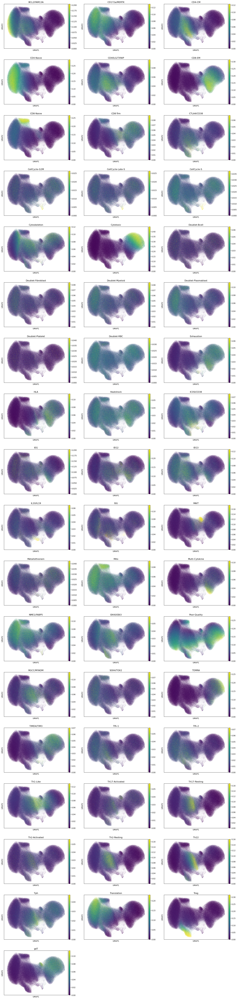

In [25]:
sc.pl.umap(adata, color=sorted(usage.columns), ncols=3, vmin=0, vmax='p99', size=0.6)

/home/workspace/environment/starcat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/workspace/environment/starcat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


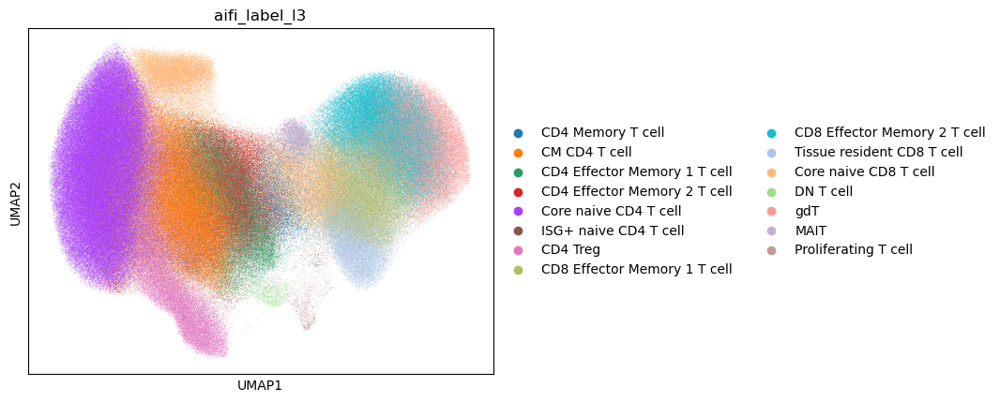

In [26]:
sc.pl.umap(adata, color='aifi_label_l3', size=0.6)

/home/workspace/environment/starcat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/workspace/environment/starcat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


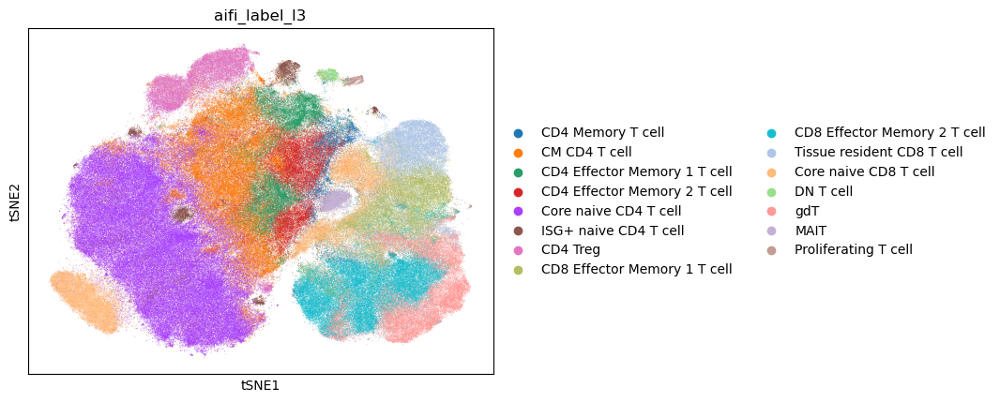

In [38]:
sc.pl.tsne(adata, color='aifi_label_l3', size=0.6)

/home/workspace/environment/starcat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/workspace/environment/starcat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


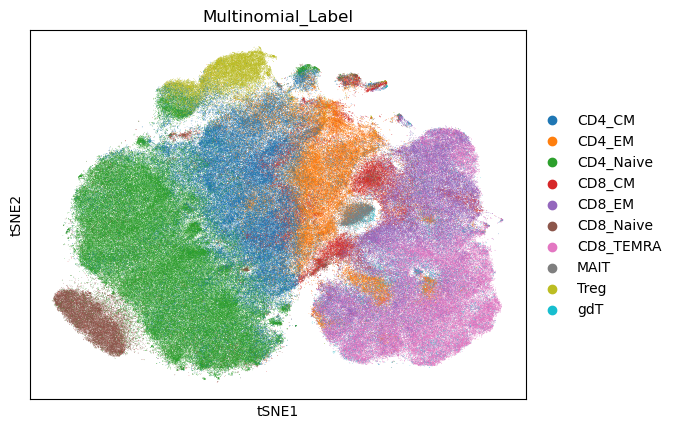

In [39]:
sc.pl.tsne(adata, color='Multinomial_Label', size=0.6)

/home/workspace/environment/starcat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/workspace/environment/starcat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


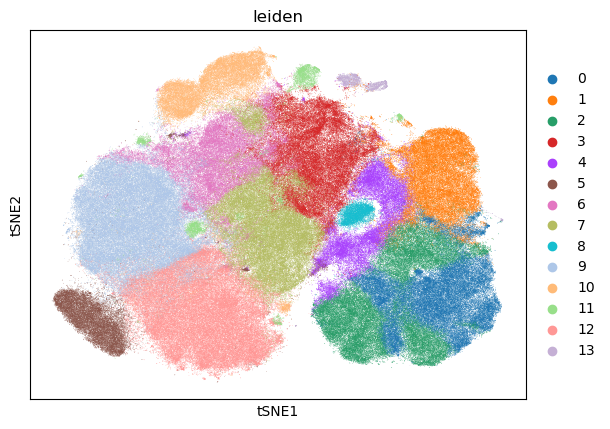

In [40]:
sc.pl.tsne(adata, color='leiden', size=0.6)

/home/workspace/environment/starcat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/workspace/environment/starcat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


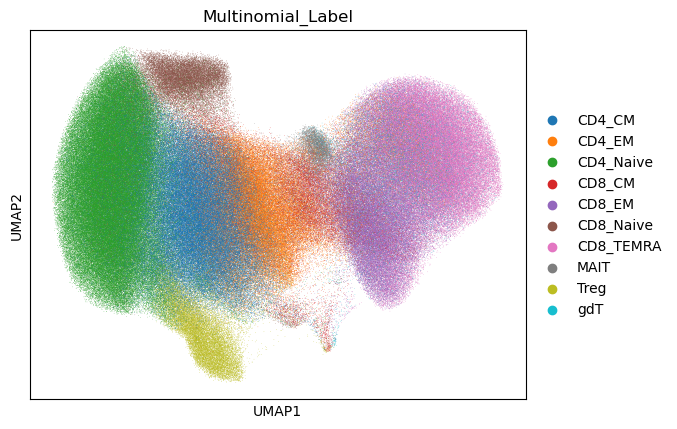

In [35]:
sc.pl.umap(adata, color='Multinomial_Label', size=0.6)